<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 20px; height: 55px">

# Capstone Project: Harmony
## 3.2 Recommending Canva Palette to Product
> Authors: Eugene Matthew Cheong
---

## Table of Contents ##

#### 1. Web Scraping

- [1.1 Scraping Lian Seng Hin Website](1.1_web_scraping_liansenghin.ipynb)
- [1.2 Scraping Hafary Website](1.2_web_scraping_hafary.ipynb)
- [1.3 Scraping Lamitak Website](1.3_web_scraping_lamitak.ipynb)
- [1.4 Scraping Nippon Website](1.4_web_scraping_nippon.ipynb)
- [1.5 Consolidate All Product Database](1.5_consolidate_product_database.ipynb)

#### 2. Preprocessing

- [2.1 Processing Canva Palettes](2.1_processing_canva_palette.ipynb)

#### 3. Modelling

- [3.1 Matching Input Photo to Products](3.1_matching_input_photo_to_products.ipynb)
- [3.2 Recommending Canva Palette to Products](3.2_recommending_canva_palette_to_product.ipynb)
- [3.3 Recommending Colours and Colour Palettes with Llama3](3.3_recommending_colours_and_colour_palettes_with_llama3.ipynb)

---

# Import Modules

In [1]:
import os
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import h5py

from skimage.io import imread
from skimage.transform import resize
from skimage.color import gray2rgb
from skimage.color import rgb2lab, lab2rgb, rgb2hsv, hsv2rgb

from scipy.spatial.distance import euclidean, cosine, cityblock


In [2]:
data_folder = "../datasets/"
data_img_folder = os.path.join(data_folder,"images")
canva_img_folder =  os.path.join(data_img_folder,"canva")
canva_palettes_df = pd.read_csv(os.path.join(data_folder,"color_palette_df.csv"))

In [3]:
canva_palettes_df

,Name,Color 1,Color 2,Color 3,Color 4
0,Rosettes and Cream,#EF7C8E,#FAE8E0,#B6E2D3,#D8A7B1
1,Rosy Flamingo,#E8B4B8,#EED6D3,#A49393,#67595E
2,Summer Splash,#05445E,#189AB4,#75E6DA,#D4F1F4
3,Pastel Dreams,#FBE7C6,#B4F8C8,#A0E7E5,#FFAEBC
4,Room for Comfort,#E7D2CC,#B9B7BD,#868B8E,#EEEDE7
...,...,...,...,...,...
515,Surprising Images,#EED6D3,#69C9BC,#F7BCA5,#F7837C
516,Wrap Around Style,#0F7D80,#E2BAB0,#FF96B7,#5FD3C8
517,Endless Cubes,#34DED0,#94FAF0,#3AF7F0,#31D1D0
518,Fog and Waterfall,#756457,#3B3C38,#D5BBA9,#F1ECE4


In [4]:
def convert_hex_to_rgb(input_hex):
  h = input_hex.lstrip('#')
  return tuple(int(h[i:i+2], 16) for i in (0, 2, 4))

In [5]:
def load_from_hdf5(all_images_filename):
    with h5py.File(all_images_filename, 'r') as f:
        # Initialize containers for images and flattened data
        images = []
        flattened_data = []

        # Iterate over items in HDF5 file and load them
        for i in range(len(f.keys()) // 2):  # Assuming each image has two corresponding keys (image and flat)
            img_key = f'image_{i}'
            flat_key = f'flat_{i}'
            
            # Load and append to respective lists
            images.append(np.array(f[img_key]))  # Convert to numpy array if necessary
            flattened_data.append(np.array(f[flat_key]))

    return images, flattened_data


# Loading preprocessed canva palettes h5 file

In [6]:
canva_filename = os.path.join(data_folder,'h5','preprocessed_canva_palettes.h5')
loaded_images, loaded_flattened_data = load_from_hdf5(canva_filename)
canva_processed_images = list(zip(loaded_images, loaded_flattened_data))

In [7]:
canva_processed_images

[(array([[[94.10001261,  0.2013199 , -1.55898242],
          [94.10001261,  0.2013199 , -1.55898242],
          [94.10001261,  0.2013199 , -1.55898242],
          ...,
          [94.10001261,  0.2013199 , -1.55898242],
          [94.10001261,  0.2013199 , -1.55898242],
          [94.10001261,  0.2013199 , -1.55898242]],
  
         [[94.10001261,  0.2013199 , -1.55898242],
          [94.10001261,  0.2013199 , -1.55898242],
          [94.10001261,  0.2013199 , -1.55898242],
          ...,
          [94.10001261,  0.2013199 , -1.55898242],
          [94.10001261,  0.2013199 , -1.55898242],
          [94.10001261,  0.2013199 , -1.55898242]],
  
         [[94.10001261,  0.2013199 , -1.55898242],
          [94.10001261,  0.2013199 , -1.55898242],
          [94.10001261,  0.2013199 , -1.55898242],
          ...,
          [94.10001261,  0.2013199 , -1.55898242],
          [94.10001261,  0.2013199 , -1.55898242],
          [94.10001261,  0.2013199 , -1.55898242]],
  
         ...,
  
        

In [8]:
# Function to preprocess and flatten images
def preprocess(image_path):
    img = imread(image_path)
    if  img.shape[2] == 4:  # Check if the image has an alpha channel
        img = img[:, :, :3]  # Remove the alpha channel if present

    # Convert the RGB image to Lab color space
    #img_lab = rgb2hsv(img)
    img_lab = rgb2lab(img)

    # Resize the image to a fixed size (e.g., 256x256)
    img_resized = resize(img_lab, (256, 256), anti_aliasing=True)
    
    # Optionally, you can flatten the image if needed for further processing
    img_flattened = img_resized.flatten()

    # Return both the resized Lab image and the flattened version
    return img_resized, img_flattened

# Finding palettes to match given product

### Finding palettes that has similar color as this file "wooddesign-blend-nougat_r-500-500-60-user-data-collections-826-5896-1524450979.jpg"

In [9]:
selected_img = os.path.join(data_img_folder,"all_images","wy_4220x_natural_eames_teak_4x8_thumbnail_1.jpg")
selected_img

'../datasets/images/all_images/wy_4220x_natural_eames_teak_4x8_thumbnail_1.jpg'

In [10]:
def safe_cosine(u, v):
    if np.linalg.norm(u) == 0 or np.linalg.norm(v) == 0:
        return 1.0  # Use 1.0 to indicate maximum dissimilarity or undefined similarity
    else:
        return cosine(u, v)

### Calculate similarities function

In [11]:
def calculate_similarities(input_imagefile_list, processed_images, input_img, number_of_results):
  # Separate the images for display and calculation
  display_images, flat_images = zip(*processed_images)

  # Add and process the new input image
  new_display_image, new_flat_image = preprocess(input_img)

  # Assuming 'new_flat_image' is a flat vector of the new image
  # and 'flat_images' is a list of flat vectors of existing images
  distances = [safe_cosine(new_flat_image, img) for img in flat_images]


  # Sort images by similarity
  sorted_indices = np.argsort(distances)[:number_of_results]  # Get indices of sorted distances

  sorted_all_images_filenames = [input_imagefile_list[index] for index in sorted_indices]

  return display_images, sorted_all_images_filenames, sorted_indices

In [12]:
canva_image_list= []

for image_file in os.listdir(canva_img_folder):
  canva_image_list.append(os.path.join(canva_img_folder,image_file))

Input selected product from the catalogue and compare it with the canva palettes

In [13]:
display_images, sorted_all_images_filenames, sorted_indices = calculate_similarities(canva_image_list, canva_processed_images, selected_img, 50)

### Function to return the hex codes that matches with the input image

In [14]:
def generate_hex_code_list(sorted_all_images_filenames):

    hex_code_list = []

    for all_images_filename in sorted_all_images_filenames:
        hex_color_file = os.path.basename(all_images_filename)
        hex_color = os.path.splitext(hex_color_file)[0]
        hex_code_list.append(f"#{hex_color}")
    return hex_code_list

hex_code_list = generate_hex_code_list(sorted_all_images_filenames)

hex_code_list

['#D5B690',
 '#C3A57C',
 '#EFCFA0',
 '#F8D7A8',
 '#D5BA90',
 '#FCDCA9',
 '#BA9973',
 '#FFE0AE',
 '#E5B990',
 '#FBC99C',
 '#FBD8B0',
 '#DBC39A',
 '#FCD699',
 '#CDA67A',
 '#F8DCB0',
 '#CCA78A',
 '#AE8B70',
 '#D6C099',
 '#FDCD93',
 '#FFCBA4',
 '#FFD898',
 '#C9B590',
 '#E6B794',
 '#FFD294',
 '#464033',
 '#B59F84',
 '#C6AD90',
 '#F6C7A5',
 '#634F40',
 '#BC9476',
 '#FBDFA0',
 '#EAB996',
 '#F3DBB2',
 '#C3B090',
 '#27231F',
 '#C2AD90',
 '#FBC490',
 '#D1B780',
 '#D6C18A',
 '#BBA78C',
 '#8B8060',
 '#DCAD90',
 '#E2B080',
 '#D1A58A',
 '#FEC8A7',
 '#D1A179',
 '#756457',
 '#BCA88E',
 '#2A231F',
 '#EFD593']

In [15]:
def plot_recommended_products(display_images, sorted_all_images_filenames, sorted_indices ,num_of_plots):
    
    fig, axs = plt.subplots(1, num_of_plots, figsize=(80, 40))  # Adjust figure size and number of subplots to 10
    for i, ax in enumerate(axs):
        ax.imshow(lab2rgb(display_images[sorted_indices[i]]))
        ax.set_title(os.path.basename(sorted_all_images_filenames[i]))
        ax.axis('off')
    plt.show()

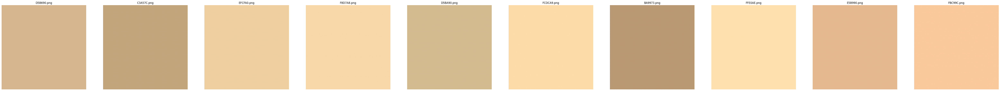

In [16]:
plot_recommended_products(display_images, sorted_all_images_filenames, sorted_indices, 10)

### Using the "hex_code_list" to find the names of the palettes that has the colours in it for recommendation

In [17]:
def find_matching_palette(df, input_hex_code_list):
  color_columns = ['Color 1', 'Color 2', 'Color 3', 'Color 4']
  df[color_columns] = df[color_columns].map(lambda x: x.upper())

  # Find rows where any of the specified colors match any of the color columns
  matched_rows = df[df[color_columns].isin(input_hex_code_list).any(axis=1)]
  matched_names = matched_rows['Name'].unique()

  return matched_names

In [18]:
palettes_found = find_matching_palette(canva_palettes_df, hex_code_list)
palettes_found

array(['Birth Spring', 'Timeless Beauty', 'Toasted Peach',
       'Pastel Meltaways', 'Candy Hearts', 'Meringues and Tea',
       'Plum and Gold', 'Black Bird', 'Chocolate Chip Delight',
       'Cotton Knits', 'Stairs and Mirrors', 'Macaron de Paris',
       'Cherry Blossom Dance', 'Space for Everything', 'Autumn Crush',
       'Nineties Grunge', 'Sun-kissed Orchids', 'Desert Blush',
       'Sun-kissed Rock', 'Door of Fortune', 'Peach Party', 'Perfect Tan',
       'California Citrus', 'Reap and Sow', 'Peach Kiss',
       'Calming Serenity', 'Easter Soft', 'Flaming Flower',
       'Easter Quirks', 'Natural Timbers Kitchen Baking', 'Ballet Dreams',
       'Cloud City', 'High and Bright', 'Monochromatic Party',
       'Pastel Popsicles', 'Breakfast Coffee Spread', 'New Beginnings',
       'Assorted Sweets', 'Chocolate Pastries', 'Lost in Leaves',
       'Hand in Hand', 'Warm and Melted', 'Sunlit Day Out',
       'Oven-baked Chocolate Chip', 'Chill Dawn',
       'Empty Auditorium Seats', '

In [19]:
palettes_found_data = canva_palettes_df[canva_palettes_df['Name'].isin(palettes_found)]
palettes_found_data

,Name,Color 1,Color 2,Color 3,Color 4
34,Birth Spring,#BCA88E,#E3E8E9,#9DA993,#E4B4B4
47,Timeless Beauty,#DACAC4,#F7C9B6,#DBC39A,#DAE7DD
56,Toasted Peach,#FBAA60,#FBC490,#F67B50,#A82810
59,Pastel Meltaways,#FEE7E6,#ECFDF1,#F9EAC2,#FFD898
98,Candy Hearts,#FEC8A7,#FCECA5,#B5EECB,#CBC7FC
103,Meringues and Tea,#BBA78C,#EFEAE4,#F4C6D4,#F3DBB2
116,Plum and Gold,#D6C099,#D6CEC0,#8E8A92,#AE8781
132,Black Bird,#140005,#464033,#7E7C73,#BBC4C2
134,Chocolate Chip Delight,#4F0000,#D9CED6,#303437,#AE8B70
141,Cotton Knits,#F3ECDA,#C4AC95,#94553D,#FFCBA4


### Plotting Found Palettes with the colors matching to the input image

In [20]:
def plot_palette(palettes_found_data):
    num_palettes = len(palettes_found_data)
    print(num_palettes)
    fig, axes = plt.subplots(num_palettes, 1, figsize=(6, num_palettes * 1), constrained_layout=True)

    # Loop through each palette and plot the colors individually
    for ax, (index, row) in zip(axes, palettes_found_data.iterrows()):
        colors = [row['Color 1'], row['Color 2'], row['Color 3'], row['Color 4']]
        ax.bar(['Color 1', 'Color 2', 'Color 3', 'Color 4'], [1, 1, 1, 1], color=colors)
        ax.set_title(row['Name'])
        ax.set_xticks([0, 1, 2, 3])
        ax.set_xticklabels(['Color 1', 'Color 2', 'Color 3', 'Color 4'])
        ax.set_yticks([])  # No need for y-axis values in this context

    plt.show()

54


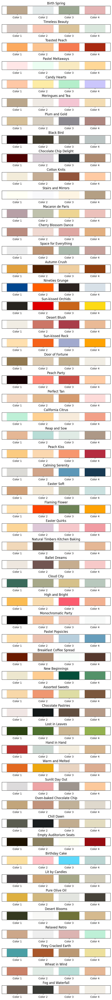

In [21]:
plot_palette(palettes_found_data)

# Recommend Products after select Palette

### Selected one palette "Natural Timbers Kitchen Baking". Recommend products based on 1 product

In [22]:
selected_palette = "Natural Timbers Kitchen Baking"
color_columns = ['Color 1', 'Color 2', 'Color 3', 'Color 4']

In [23]:
palette_colors = canva_palettes_df[canva_palettes_df['Name'] == selected_palette][color_columns]

color_list = palette_colors.iloc[0].tolist()

### Importing 'all_products_df.csv' so that we can get the model names to show which product matches the selected color palette

In [24]:
all_products_df = pd.read_csv('../datasets/all_products_df.csv')
image_folder = '../datasets/images/all_images'

### Importing preprocessed_all_images.h5 

In [25]:
all_images_filename = os.path.join(data_folder,'h5','preprocessed_all_images.h5')
loaded_images, loaded_flattened_data = load_from_hdf5(all_images_filename)
all_img_processed_images = list(zip(loaded_images, loaded_flattened_data))

In [26]:
all_img_processed_images

[(array([[[ 9.92948809e+01, -2.44001525e-03,  4.62513481e-03],
          [ 9.95179393e+01, -2.44473589e-03,  4.63408295e-03],
          [ 9.78533937e+01, -2.40950868e-03,  4.56730854e-03],
          ...,
          [ 9.83987117e+01, -9.97777787e-01, -7.78624125e-01],
          [ 9.99453436e+01, -4.68474530e-02, -3.19620039e-02],
          [ 1.00000000e+02, -2.45493786e-03,  4.65342115e-03]],
  
         [[ 9.87897940e+01, -2.42932596e-03,  4.60487289e-03],
          [ 9.90109234e+01, -2.43400578e-03,  4.61374365e-03],
          [ 9.66053331e+01, -2.38309565e-03,  4.51724172e-03],
          ...,
          [ 8.75534241e+01, -9.19781008e-01, -1.19622454e+00],
          [ 9.99499514e+01, -4.43657235e-02, -2.23193060e-02],
          [ 1.00000000e+02, -2.45493786e-03,  4.65342115e-03]],
  
         [[ 9.97957590e+01, -2.45061546e-03,  4.64522788e-03],
          [ 9.88650586e+01, -2.43091881e-03,  4.60789219e-03],
          [ 9.53226502e+01, -2.35594990e-03,  4.46578600e-03],
          ...,
  

In [27]:
all_image_list= []

all_image_folder = '../datasets/images/all_images'

for image_file in os.listdir(all_image_folder):
  all_image_list.append(os.path.join(all_image_folder,image_file))

# Final Result

Use each color in the selecte palette and compares with all the products in the catalogue. Shows the closest color match.

Find products to match palette Natural Timbers Kitchen Baking | #F0D8B8: F0D8B8.png


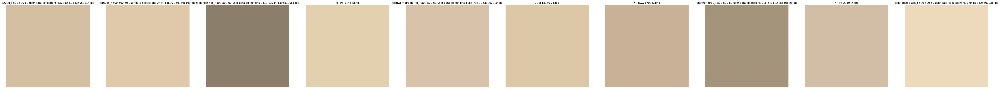

Find products to match palette Natural Timbers Kitchen Baking | #634F40: 634F40.png


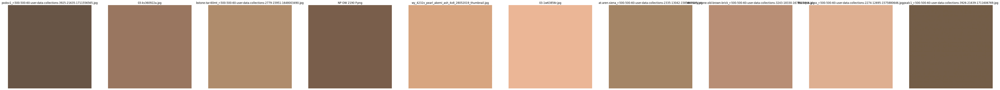

Find products to match palette Natural Timbers Kitchen Baking | #F3F0E9: F3F0E9.png


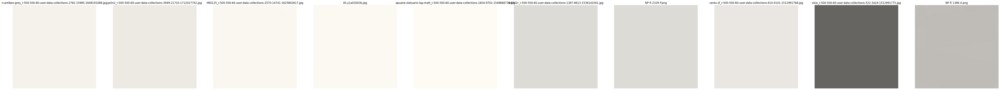

Find products to match palette Natural Timbers Kitchen Baking | #E6B794: E6B794.png


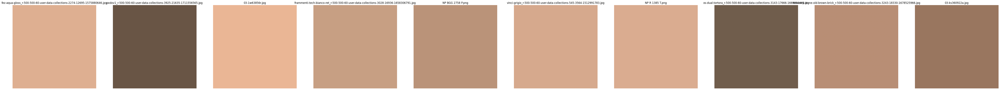

In [28]:
for color in color_list:
  selected_color = color.replace('#','')
  selected_color_img_file = os.path.join(canva_img_folder,f"{selected_color}.png")
  print(f"Find products to match palette {selected_palette} | {color}: {os.path.basename(selected_color_img_file)}")

  found_display_images, found_sorted_all_images_filenames, found_sorted_indices = calculate_similarities(all_image_list, all_img_processed_images, selected_color_img_file, 10)

  plot_recommended_products(found_display_images, found_sorted_all_images_filenames, found_sorted_indices, len(found_sorted_indices))


From the results, most of the results are mainly from the paint catalogue as the product images are generated from hex codes, making them cleaner and closer in similarity to the colours of the palette. There are more products in the list, so if a filtering system is implemented, it'll be easier to find specific materials like tiles and laminates.

---

### Next Notebook: [3.3 Recommending Colours and Colour Palettes with Llama3](3.3_recommending_colours_and_colour_palettes_with_llama3.ipynb)
